In [1]:
%matplotlib inline

import cv2
import matplotlib.pyplot as plt
import numpy as np
import copy

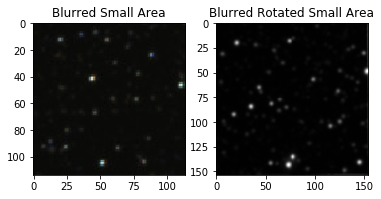

In [2]:
# Load the training image
image_1 = cv2.imread('Small_area.png')
image_2 = cv2.imread('Small_area_rotated.png')

# Convert the training image to RGB
training_image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB)
training_image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)

# Convert the training image to gray Scale
training_gray_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2GRAY)
training_gray_1 = cv2.GaussianBlur(training_gray_1, (3, 3), 0)
training_gray_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)
training_gray_2 = cv2.GaussianBlur(training_gray_2, (3, 3), 0)
# Display the images
plt.subplot(121)
plt.title('Blurred Small Area')
plt.imshow(training_image_1, cmap = 'gray')
plt.subplot(122)
plt.title('Blurred Rotated Small Area')
plt.imshow(training_gray_2, cmap = 'gray')

plt.show()

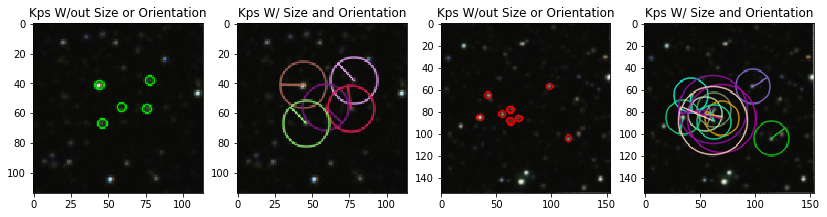


Number of keypoints Detected in Small Area:  5

Number of keypoints Detected in Rotated Small Area:  11


In [3]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(200, 2.0)

# Find the keypoints in the gray scale training image and compute their ORB descriptor.
# The None parameter is needed to indicate that are not using a mask.
keypoints_1, descriptor_1 = orb.detectAndCompute(training_gray_1, None)
keypoints_2, descriptor_2 = orb.detectAndCompute(training_gray_2, None)

# Create copies of the training image to draw our keypoints on
keyp_without_size_1 = copy.copy(training_image_1)
keyp_with_size_1 = copy.copy(training_image_1)
keyp_without_size_2 = copy.copy(training_image_2)
keyp_with_size_2 = copy.copy(training_image_2)

# Draw the keypoints without size or orientation on one copy of the training image 
cv2.drawKeypoints(training_image_1, keypoints_1, keyp_without_size_1, color = (0, 255, 0))
cv2.drawKeypoints(training_image_2, keypoints_2, keyp_without_size_2, color = (255, 0, 0))

# Draw the keypoints with size and orientation on the other copy of the training image
cv2.drawKeypoints(training_image_1, keypoints_1, keyp_with_size_1, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(training_image_2, keypoints_2, keyp_with_size_2, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the image with the keypoints without size or orientation
plt.subplot(141)
plt.title('Kps W/out Size or Orientation')
plt.imshow(keyp_without_size_1)

# Display the image with the keypoints with size and orientation
plt.subplot(142)
plt.title('Kps W/ Size and Orientation')
plt.imshow(keyp_with_size_1)

# Display the image with the keypoints without size or orientation
plt.subplot(143)
plt.title('Kps W/out Size or Orientation')
plt.imshow(keyp_without_size_2)

# Display the image with the keypoints with size and orientation
plt.subplot(144)
plt.title('Kps W/ Size and Orientation')
plt.imshow(keyp_with_size_2)

plt.show()

# Print the number of keypoints detected
print("\nNumber of keypoints Detected in Small Area: ", len(keypoints_1))
print("\nNumber of keypoints Detected in Rotated Small Area: ", len(keypoints_2))

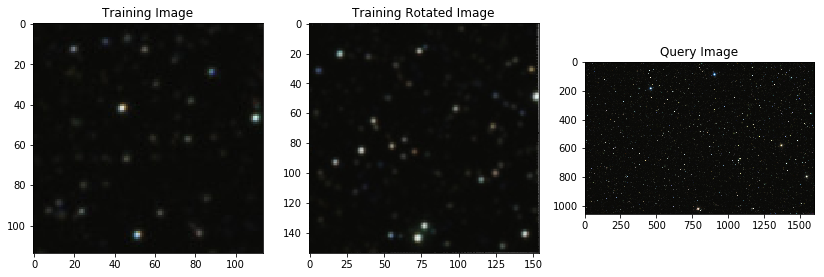

In [4]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training images
image1 = cv2.imread('Small_area.png')
image2 = cv2.imread('Small_area_rotated.png')

# Load the query image
image3 = cv2.imread('StarMap.png')

# Convert the training images to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
training_rot_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image3, cv2.COLOR_BGR2RGB)

# Display the images
plt.subplot(131)
plt.imshow(training_image)
plt.title('Training Image')
plt.subplot(132)
plt.imshow(training_rot_image)
plt.title('Training Rotated Image')
plt.subplot(133)
plt.imshow(query_image)
plt.title('Query Image')
plt.show()

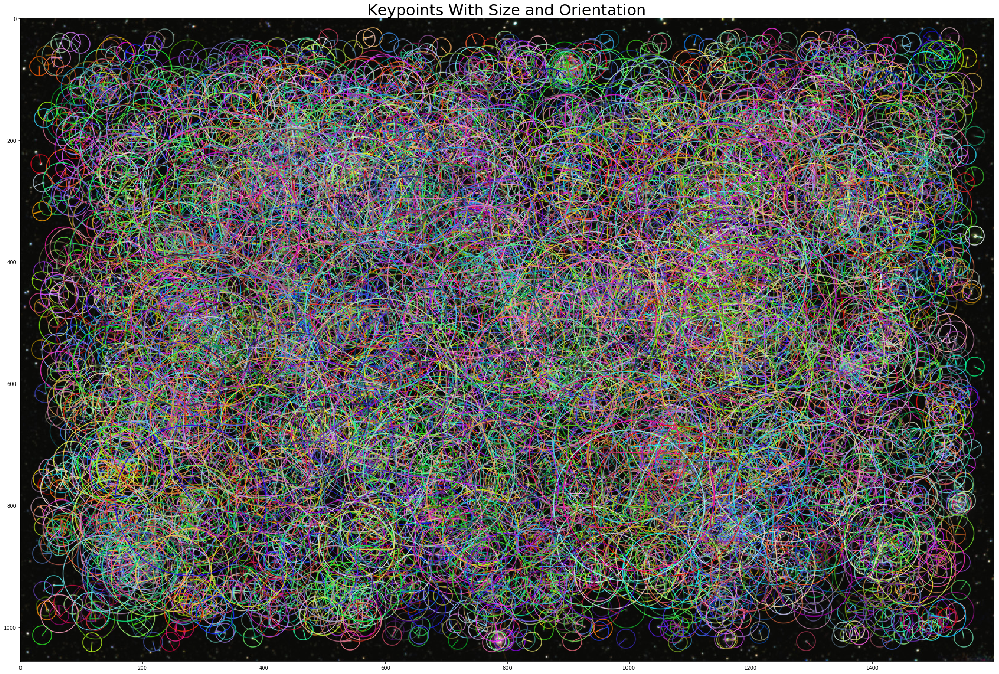


Number of keypoints Detected:  5606


In [5]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [34.0, 34.0]

# Convert the training images to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
training_rot_gray = cv2.cvtColor(training_rot_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(10000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that are not using a mask in either case.  
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_rot_train, descriptors_rot_train = orb.detectAndCompute(training_rot_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create copies of the query images to draw our keypoints on
query_img_keyp = copy.copy(query_image)

# Draw the keypoints with size and orientation on the copy of the query image
cv2.drawKeypoints(query_image, keypoints_query, query_img_keyp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the query image with the keypoints with size and orientation
plt.title('Keypoints With Size and Orientation', fontsize = 30)
plt.imshow(query_img_keyp)
plt.show()

# Print the number of keypoints detected
print("\nNumber of keypoints Detected: ", len(keypoints_query))

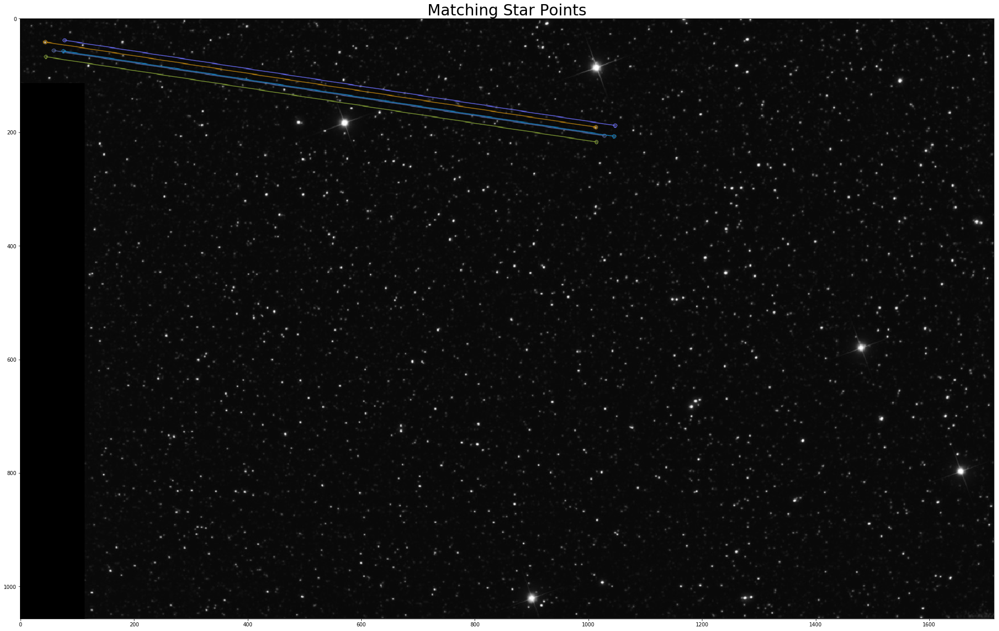

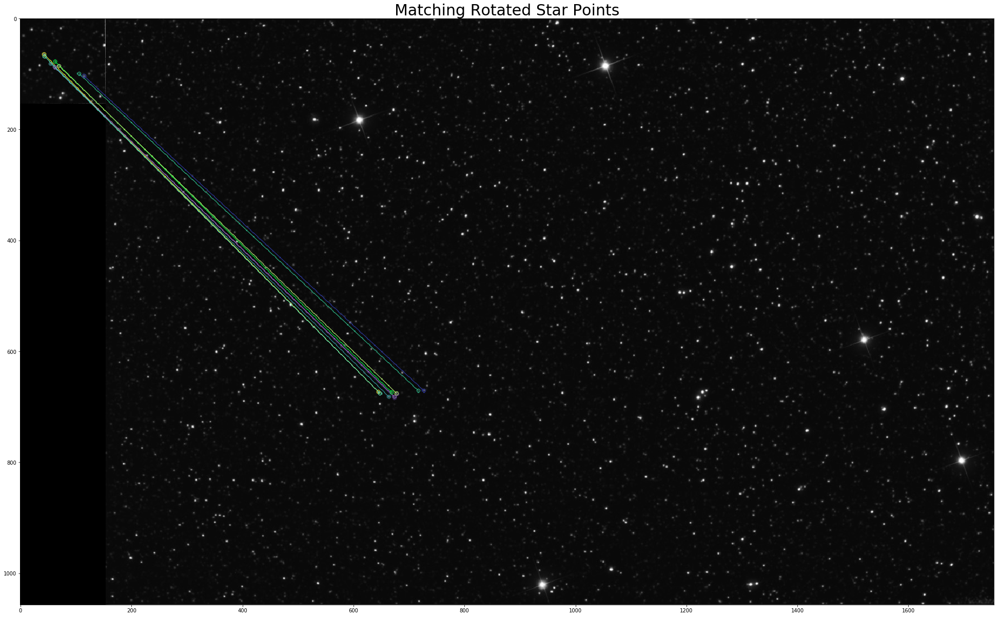

Number of Keypoints Detected In The Image:  5
Number of Keypoints Detected In The Rotated Image:  12
Number of Keypoints Detected In The Query Image:  5606

Number of Matching Keypoints Between The Training and Query Images:  5


In [6]:
# Create a Brute Force Matcher object. Set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)
matches_rot = bf.match(descriptors_rot_train, descriptors_query)

# The matches with shorter distance are the wanted ones. Sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)
matches_rot = sorted(matches_rot, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. Draw the first 10 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:10], query_gray, flags = 2)
result_rot = cv2.drawMatches(training_rot_gray, keypoints_rot_train, query_gray, keypoints_query, matches_rot[:10], query_gray, flags = 2)

# Display the final image with cropped image
plt.title('Matching Star Points', fontsize = 30)
plt.imshow(result)
plt.show()

# Display the final image with rotated sub-image
plt.title('Matching Rotated Star Points', fontsize = 30)
plt.imshow(result_rot)
plt.show()

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Image: ", len(keypoints_train))

# Print the number of keypoints detected in the training(rotated) image
print("Number of Keypoints Detected In The Rotated Image: ", len(keypoints_rot_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching Keypoints between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

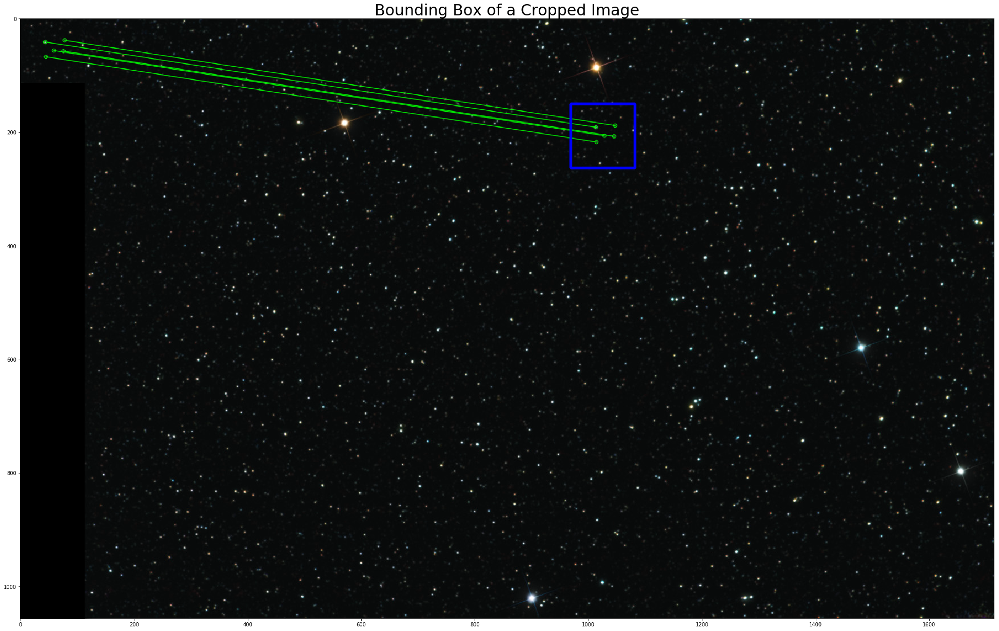

In [7]:
src_pts = np.float32([ keypoints_train[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints_query[m.trainIdx].pt for m in matches]).reshape(-1,1,2)

M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 2.0)
matchesMask = mask.ravel().tolist()
h,w = image1.shape[:2]
pts = np.float32([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2)

dst = cv2.perspectiveTransform(pts,M)
dst += (w, 0)  # adding offset

draw_params = dict(matchColor = (0,255,0), # draw matches in green color
               singlePointColor = None,
               matchesMask = matchesMask, # draw only inliers
               flags = 2)
# Draw the keypoints from source to destination points
img3 = cv2.drawMatches(image1,keypoints_train,image3,keypoints_query,matches, None,**draw_params)

# Draw the bounding box of cropped image
img3 = cv2.polylines(img3, [np.int32(dst)], True, (0,0,255),3, cv2.LINE_AA)

# Display the final image
plt.title('Bounding Box of a Cropped Image', fontsize = 30)
plt.imshow(img3)
plt.show()

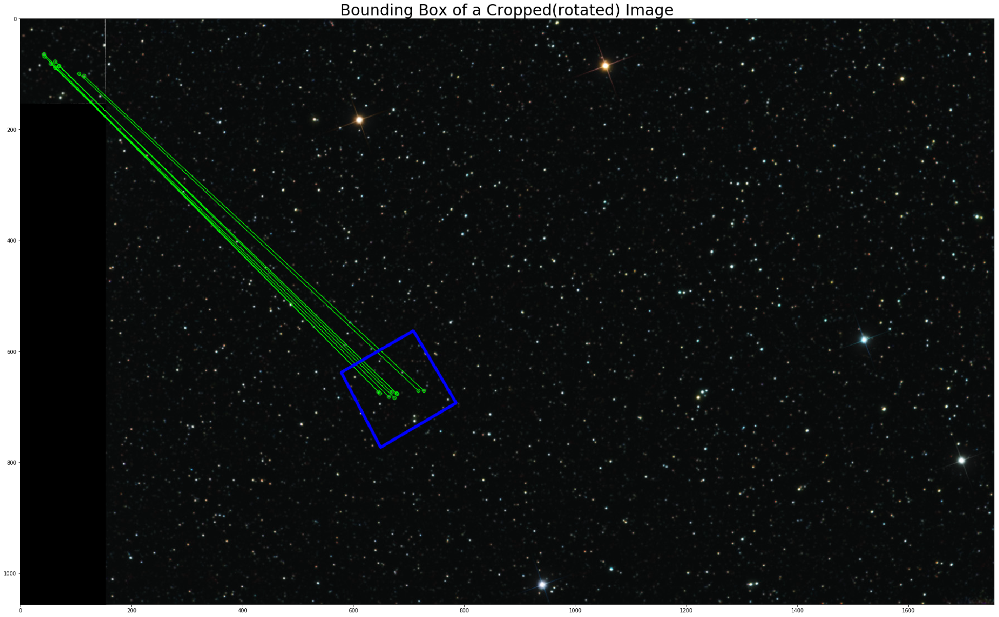

In [8]:
src_pts = np.float32([ keypoints_rot_train[m.queryIdx].pt for m in matches_rot]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints_query[m.trainIdx].pt for m in matches_rot]).reshape(-1,1,2)

M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 2.0)
matchesMask = mask.ravel().tolist()
h,w = image2.shape[:2]
pts = np.float32([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2)

dst = cv2.perspectiveTransform(pts,M)
dst += (w, 0)  # adding offset

draw_params = dict(matchColor = (0,255,0), # draw matches in green color
               singlePointColor = None,
               matchesMask = matchesMask, # draw only inliers
               flags = 2)

# Draw the keypoints from source to destination points
img3 = cv2.drawMatches(image2,keypoints_rot_train,image3,keypoints_query,matches_rot, None,**draw_params)

# Draw the bounding box of cropped image
img3 = cv2.polylines(img3, [np.int32(dst)], True, (0,0,255),3, cv2.LINE_AA)

# Display the final image
plt.title('Bounding Box of a Cropped(rotated) Image', fontsize = 30)
plt.imshow(img3)
plt.show()